In [16]:
import math
import json
import pandas as pd
import plotly.express as px

# Import data
file_name = "../data/miceies/Peromyscus_maniculatus.csv"
species_data = pd.read_csv(file_name)

# Convert all to metric units
for attribute in ["total length", "tail length", "hind foot with claw", "ear from notch", "ear from crown"]:
    species_data[attribute] = species_data.apply(lambda x: x[attribute] * 25.4 if x[f"{attribute} unit"] == 'in' else x[attribute], axis=1)
    #species_data = species_data.drop(columns=[f"{attribute} unit"])

species_data['weight'] = species_data.apply(lambda x: x['weight'] * 28.3495 if x["weight unit"] == 'oz' else x['weight'], axis=1)


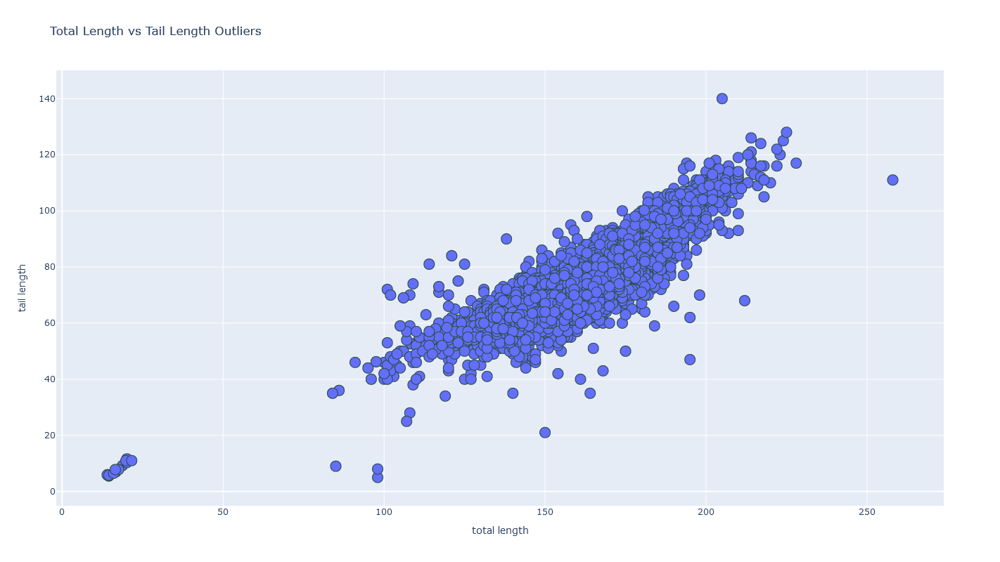

In [17]:
fig = px.scatter(species_data, x="total length", y="tail length", hover_data=['guid'], title="Total Length vs Tail Length Outliers",
                 height=800)

fig.update_traces(marker=dict(size=15,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))


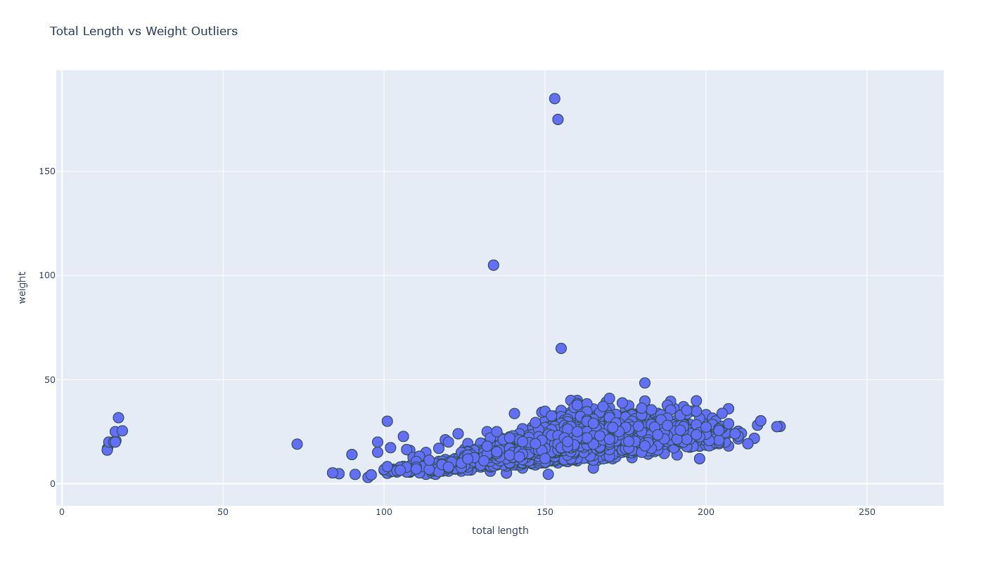

In [18]:
fig = px.scatter(species_data, x="total length", y="weight", hover_data=['guid'], title="Total Length vs Weight Outliers",
                 height=800)

fig.update_traces(marker=dict(size=15,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

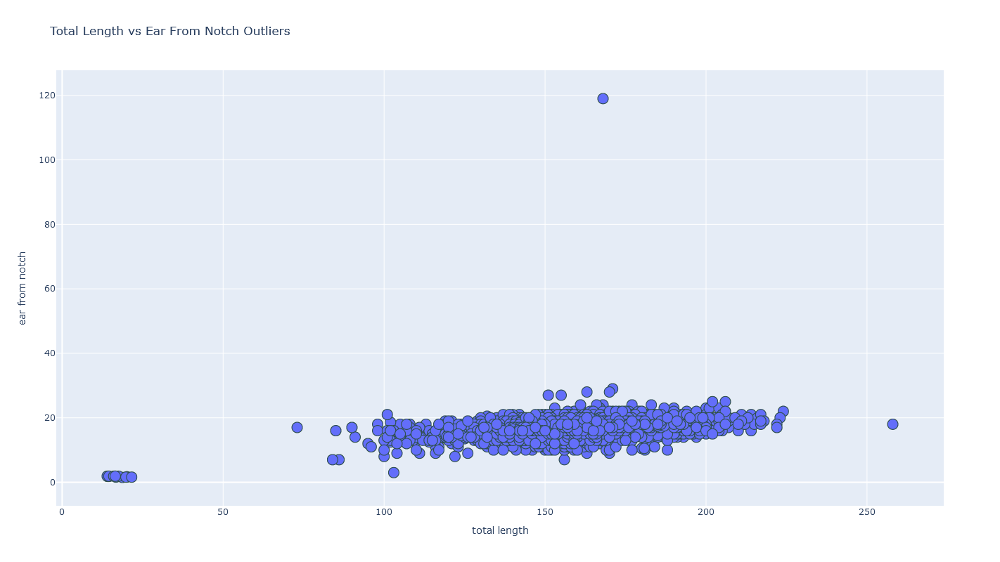

In [19]:
fig = px.scatter(species_data, x="total length", y="ear from notch", hover_data=['guid'], title="Total Length vs Ear From Notch Outliers",
                 height=800)

fig.update_traces(marker=dict(size=15,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

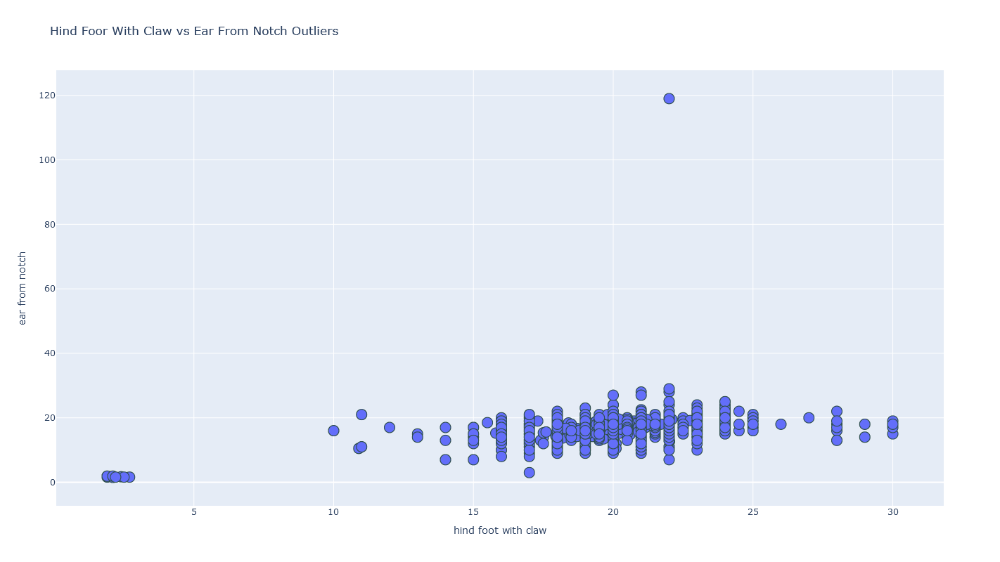

In [20]:
fig = px.scatter(species_data, x="hind foot with claw", y="ear from notch", hover_data=['guid'], title="Hind Foor With Claw vs Ear From Notch Outliers",
                 height=800)

fig.update_traces(marker=dict(size=15,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

In [22]:
from scipy.stats import zscore

species_data = species_data.dropna(subset=["weight", "total length"]).copy()

species_data["body_ratio"] = species_data["total length"] / species_data["weight"]

species_data["weight_z"] = species_data[["weight"]].apply(zscore).apply(abs)
species_data["total_length_z"] = species_data[["total length"]].apply(zscore).apply(abs)
species_data_no_outliers = species_data.query("weight_z <= 4 and total_length_z <= 4").copy()

species_data_no_outliers["body_ratio_z"] = species_data_no_outliers[["body_ratio"]].apply(zscore).apply(abs)

In [23]:
print(species_data["weight"].mean())

species_data_no_outliers["status"] = species_data_no_outliers.apply(lambda x: "outlier" if x["body_ratio_z"] >= 4 else "normal", axis=1)
species_data.query("weight_z <= -3 or weight_z >= 3").copy()[["guid", "weight", "weight_z"]]


19.18054496248001


,guid,weight,weight_z
3512,MVZ:Mamm:31580,40.0,3.504836
3571,MVZ:Mamm:33695,40.0,3.504836
3621,MVZ:Mamm:35942,38.5,3.252319
3653,MVZ:Mamm:36786,39.7,3.454332
3869,MVZ:Mamm:48837,39.2,3.370160
3945,MVZ:Mamm:53033,38.8,3.302822
3965,MVZ:Mamm:53091,37.1,3.016637
5286,MVZ:Mamm:111834,39.6,3.437498
5529,MVZ:Mamm:128065,37.7,3.117644
6303,MVZ:Mamm:208149,175.0,26.231309


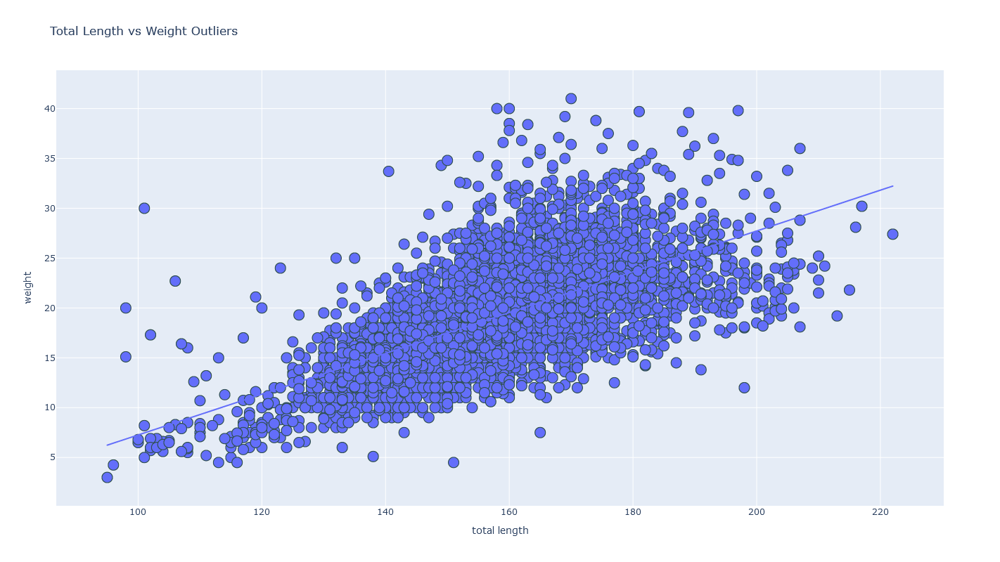

In [24]:
fig = px.scatter(species_data_no_outliers, x="total length", y="weight", hover_data=['guid', 'body_ratio', 'body_ratio_z'], title="Total Length vs Weight Outliers",
                 height=800, trendline="ols")

fig.update_traces(marker=dict(size=15,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

In [25]:
species_data_no_outliers["body_ratio"].mean()

np.float64(8.731221802134762)

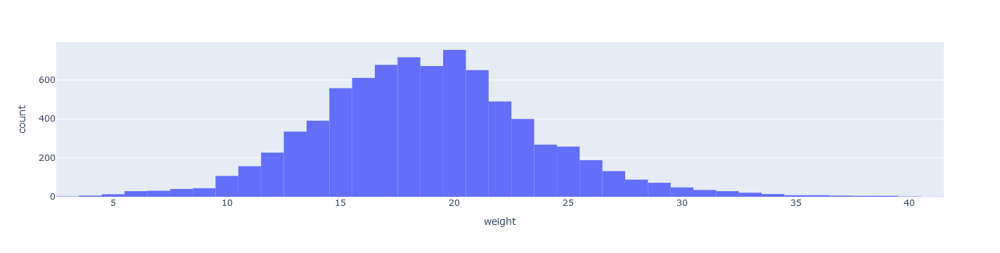

In [26]:
import math
px.histogram(species_data_no_outliers["weight"].apply(math.floor), x="weight")

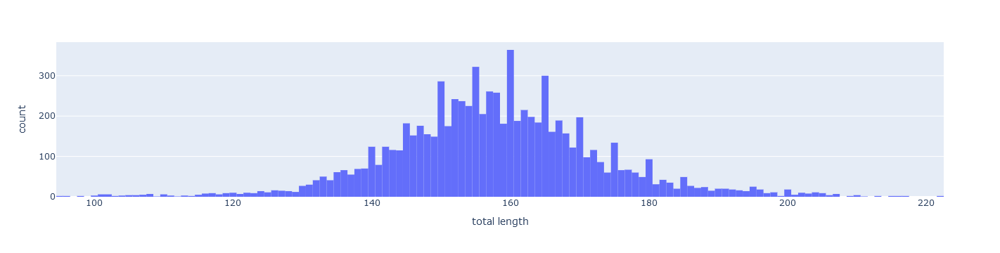

In [28]:
px.histogram(species_data_no_outliers["total length"].apply(math.floor), x="total length")

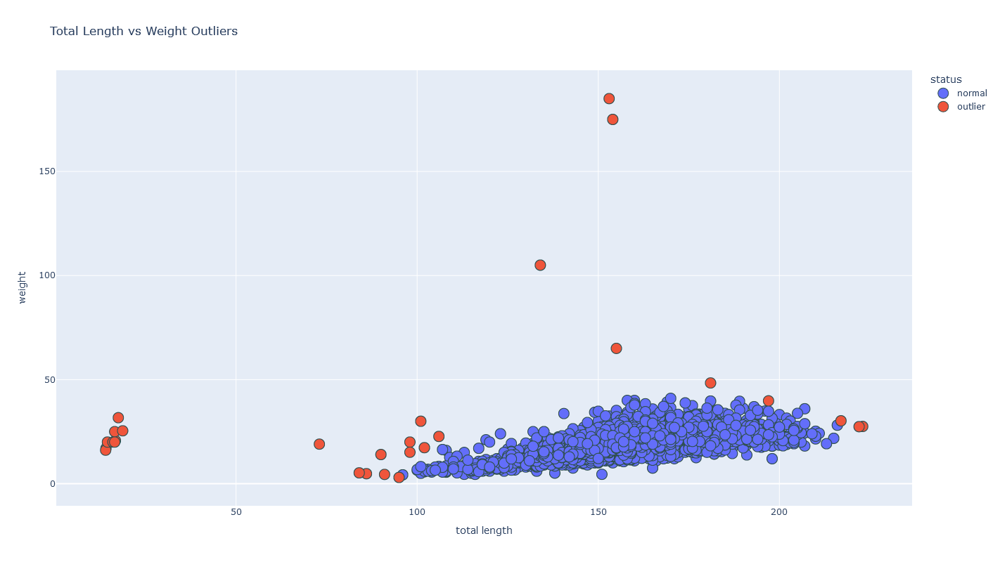

In [30]:
from sklearn.neighbors import KernelDensity
import numpy as np

kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(species_data_no_outliers[["total length","weight"]])

species_data_no_outliers["density"] = kde.score_samples(species_data_no_outliers[["total length","weight"]])
threshold = np.percentile(species_data_no_outliers["density"], 8)

kde = KernelDensity(kernel='gaussian', bandwidth=0.5).fit(species_data_no_outliers.query("density >= @threshold")[["total length","weight"]])

species_data["density"] = kde.score_samples(species_data[["total length","weight"]])
threshold = np.percentile(species_data["density"], 0.5)

species_data["status"] = species_data.apply(lambda x: "outlier" if x["density"] <= threshold else "normal", axis=1)

fig = px.scatter(species_data, x="total length", y="weight", color="status", hover_data=['guid'], title="Total Length vs Weight Outliers",
                 height=800)

fig.update_traces(marker=dict(size=15,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))